In [1]:
import numpy as np

import jax
import jax.numpy as jnp
from jax import grad, jit, vmap
import jaxopt

import numpyro
from numpyro import distributions as dist
from numpyro import infer
from numpyro_ext import distributions as distx
from numpyro_ext import info, optim

from exo4jax.light_curves import QuadLightCurve
from exo4jax.orbits import TransitOrbit

import matplotlib 
import matplotlib as mpl

import os, glob
from time import time as clock
from tqdm import tqdm
from functools import partial


import lightkurve as lk

import arviz as az

import tinygp
from tinygp import GaussianProcess, kernels, transforms

jax.config.update("jax_enable_x64", True)


%pylab inline --no-import-all


matplotlib.rcParams['image.origin'] = 'lower'
matplotlib.rcParams['figure.figsize']=(10.0,10.0)    #(6.0,4.0)
matplotlib.rcParams['font.size']=16              #10 
matplotlib.rcParams['savefig.dpi']= 300             #72 
matplotlib.rcParams['axes.facecolor']='white'
matplotlib.rcParams['savefig.facecolor']='white'
cmap = mpl.cm.seismic

numpyro.set_host_device_count(2)

/Users/benjaminpope/opt/anaconda3/envs/p2p/lib/python3.10/site-packages/tqdm/auto.py:22: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


%pylab is deprecated, use %matplotlib inline and import the required libraries.
Populating the interactive namespace from numpy and matplotlib


In [2]:
tpf = lk.search_targetpixelfile('EPIC 212521166',mission='K2')[0].download()
tpf = tpf[~tpf.nan_time_mask]


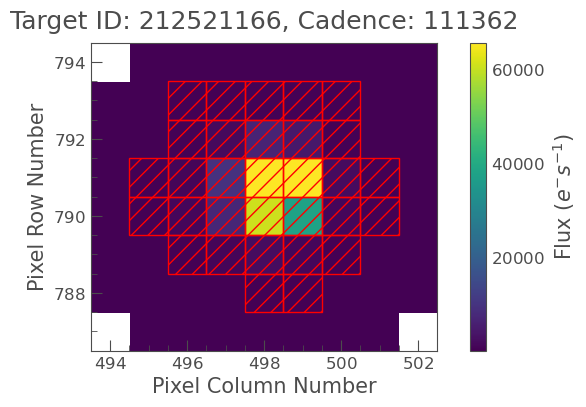

In [3]:
mask = (tpf.create_threshold_mask(0.3)) * np.all(np.isfinite(tpf.flux),axis=0)
data = tpf.flux.value[:,mask]
tpf.plot(aperture_mask=mask);


In [14]:
# parameters from Osborn et al https://www.aanda.org/articles/aa/pdf/2017/08/aa28932-16.pdf
period = 13.86375
epoch = 2457275.32992
ecc = 0.079
omega = 90 # totally uncertain
i = 89.35
b = 0.34
aRstar = 30.8
ua = 0.5322 # linear
ub = 0.1787 # quadratic
u = jnp.array([ua,ub])
dur = 3.22 
rprstar = 0.0333 


param_guess = {
    "log_f0": 0.0,
    "u": jnp.array([ua,ub]),
    "log_duration": jnp.log(3.22/24.),
    "t0": 2386.875,
    "b": 0.34,
    "log_r": jnp.log(rprstar),
    "log_amp": jnp.log(0.0001),
    "log_ell": jnp.log(20),
    'slope':0.,
    'intercept':1.,
    'log_diag':jnp.log(y_err**2)
}

y_err = 0.00001

In [15]:
pixel_series = jnp.array(data.copy())
ngood = pixel_series.shape[1]
c0 = jnp.ones(ngood)/ngood

X = t = jnp.array(tpf.time.value)

def build_gp(params):
    kernel = jnp.exp(params["log_amp"]) * (kernels.quasisep.Matern32(jnp.exp(params["log_ell"]))
                                          )        
    return GaussianProcess(kernel, X, diag=jnp.exp(params["log_diag"]))

def softmax(coefficients):
    intermediate = jax.nn.softmax(coefficients)
    return intermediate/jnp.max(intermediate)

def make_lc(coefficients):
    intermediate = jnp.dot(pixel_series,softmax(coefficients))
    return intermediate / jnp.mean(intermediate)

def tv(ff):
    return jnp.sum(jnp.abs(ff[1:]-ff[:-1]))




In [16]:
%%time

# tv
@jax.jit
def loss(coefficients):
    return tv(make_lc(coefficients))


c0 = jnp.ones(ngood)/ngood

solver = jaxopt.ScipyMinimize(fun=loss,method='L-BFGS-B')
soln = solver.run(c0)
halo_weights = soln.params.block_until_ready()


CPU times: user 344 ms, sys: 7.33 ms, total: 351 ms
Wall time: 349 ms


In [17]:
%%time

c0 = jnp.ones(ngood)/ngood

param_guess['coefficients'] = c0

# full gp
@jax.jit
def loss(params):
    return -build_gp(params).log_probability(make_lc(params['coefficients']))#-lnprior(params)


solver = jaxopt.ScipyMinimize(fun=loss,method='L-BFGS-B')
soln = solver.run(param_guess)

fullgp_weights=soln.params['coefficients']
fullgp_likelihood = soln.state.fun_val.block_until_ready()
print('Full GP Log Likelihood',fullgp_likelihood)


Full GP Log Likelihood -26169.31434809685
CPU times: user 2.77 s, sys: 27.2 ms, total: 2.8 s
Wall time: 2.8 s


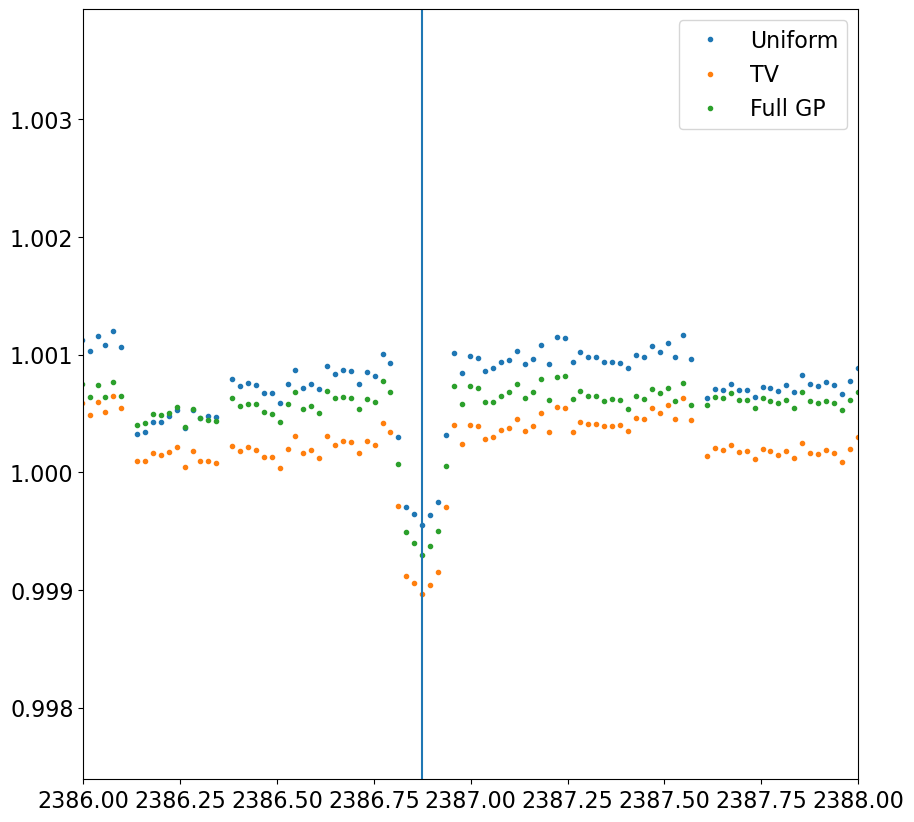

In [18]:
halo_lc = make_lc(halo_weights)
linear = make_lc(np.ones(ngood))
fullgp_lc = make_lc(fullgp_weights)

plt.plot(t,linear/jnp.mean(linear),'.',label='Uniform')
plt.plot(t,halo_lc,'.',label='TV')
plt.plot(t,fullgp_lc,'.',label='Full GP')

plt.axvline(2386.875)
plt.xlim(2386,2388)
plt.legend()

In [19]:
print('Linear',lk.convenience.estimate_cdpp(linear))
print('TV',lk.convenience.estimate_cdpp(halo_lc))
# print('GP',lk.convenience.estimate_cdpp(gp_lc))
print('Full GP',lk.convenience.estimate_cdpp(fullgp_lc))


Linear 82.09658622652755 ppm
TV 36.553788375843496 ppm
Full GP 27.088349474480612 ppm


Now let's do it with a deterministic transit model:

In [20]:
ts = jnp.array(tpf.time.value)
t_grid = jnp.linspace(ts.min()-1,ts.max()+1,10000)

In [21]:
def light_curve(params, t, period=period):
    lc = QuadLightCurve.init(u1=params["u"][0], u2=params["u"][1])
    orbit = TransitOrbit.init(
        period=period,
        duration=jnp.exp(params["log_duration"]),
        time_transit=params["t0"],
        impact_param=params["b"],
        radius=jnp.exp(params["log_r"]),
    )
    return jnp.exp(params["log_f0"]) * (params['slope']*(t-params['t0']) + params['intercept'] + lc.light_curve(orbit, t)[0])


def build_gp(params, t, diag):
    kernel = jnp.exp(2 * params["log_amp"]) * kernels.quasisep.Matern32(
    jnp.exp(params["log_ell"])
)
    return GaussianProcess(kernel, t, diag=diag, mean=partial(light_curve,params))


In [22]:
param_guess = {
    "log_f0": 0.0,
    "u": jnp.array([0.5322, 0.1787]),
    "log_duration": jnp.log(3.22/24.),
    "t0": 2386.875,
    "b": 0.34,
    "log_r": jnp.log(rprstar),
    "log_amp": jnp.log(0.0001),
    "log_ell": jnp.log(20),
    'coefficients':c0,
    'slope':0.,
    'intercept':1.
}
y_err = 0.00001

In [23]:
kernel = jnp.exp(2 * param_guess["log_amp"]) * kernels.quasisep.Matern32(
    jnp.exp(param_guess["log_ell"])
)
gp = GaussianProcess(kernel, t, diag=0.001,mean=partial(light_curve,param_guess))


In [24]:
# t = jnp.array(ts.copy())

# fig = plt.figure(figsize=(6.0,4.0))
# lc_test = light_curve(param_guess,t,period=period)
# plt.plot(t,lc_test)


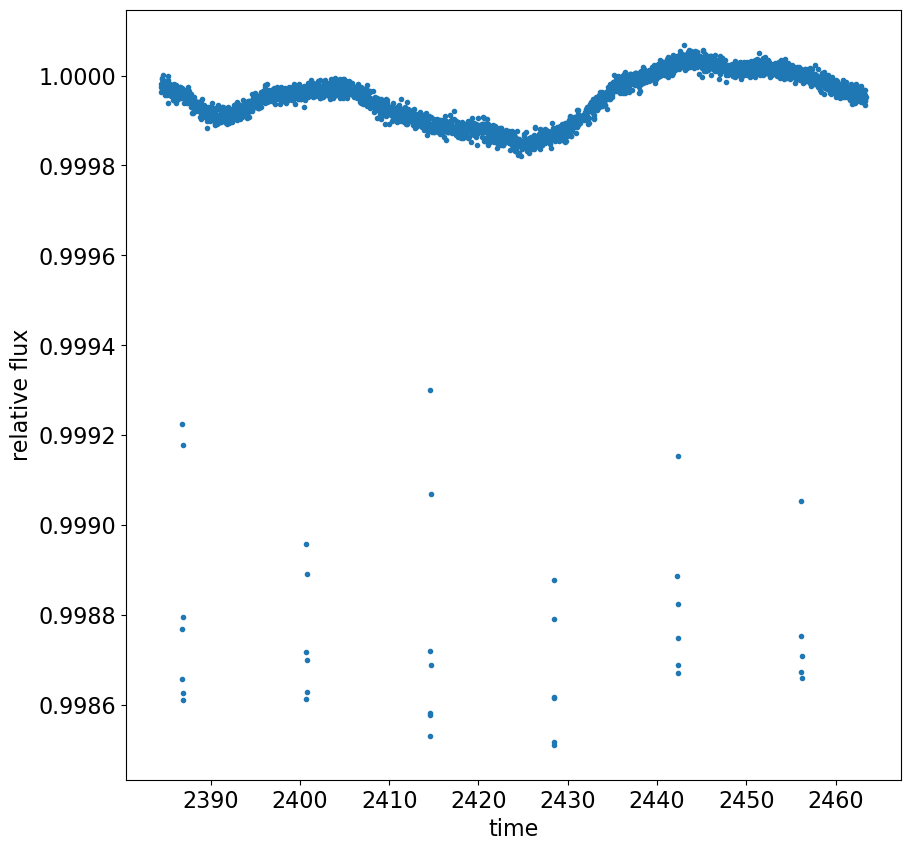

In [25]:

gp = build_gp(param_guess, t, diag=y_err**2)
y = gp.sample(jax.random.PRNGKey(1047))
plt.plot(t, y, ".")
plt.xlabel("time")
plt.ylabel("relative flux");


In [26]:
%time
@jax.jit
def loss(params):
    return -build_gp(params,t,diag=y_err**2).log_probability(make_lc(params['coefficients']))#-lnprior(params)


solver = jaxopt.ScipyMinimize(fun=loss,method='L-BFGS-B')
soln = solver.run(param_guess)

lcgp_weights=soln.params['coefficients']
lcgp_likelihood = soln.state.fun_val.block_until_ready()
print('LC+GP Log Likelihood',lcgp_likelihood)


CPU times: user 1 µs, sys: 1e+03 ns, total: 2 µs
Wall time: 6.91 µs
LC+GP Log Likelihood 167724.81275820252


Linear 82.09658622652755 ppm
TV 36.553788375843496 ppm
LC GP 27.417720251781905 ppm
GP (no transit) 27.088349474480612 ppm


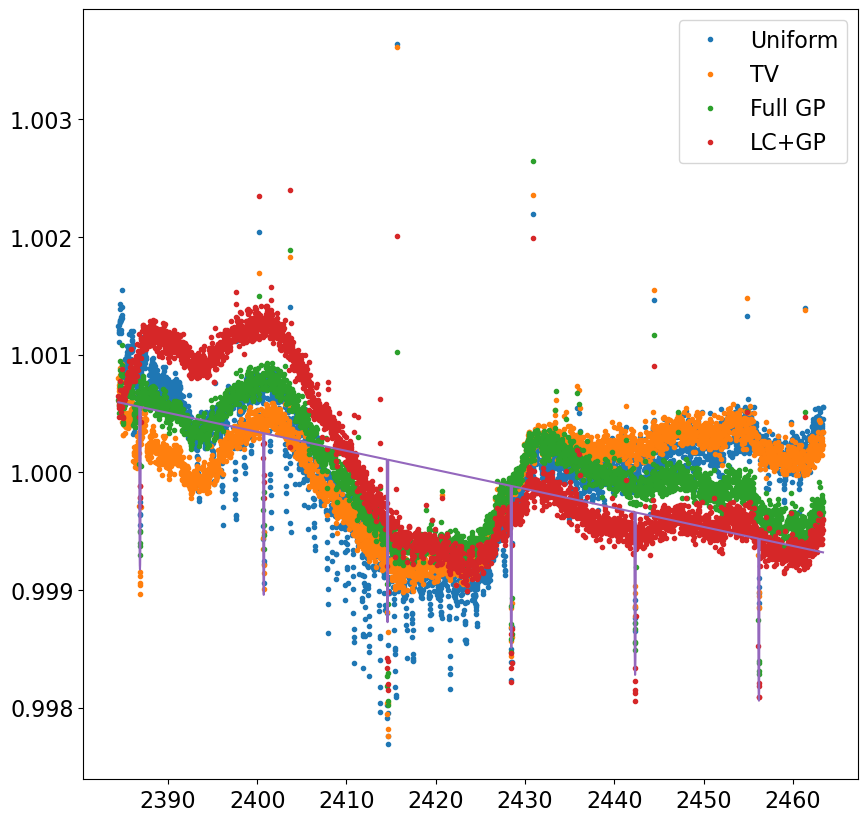

In [27]:
halo_lc = make_lc(halo_weights)
linear = make_lc(np.ones(ngood))
fullgp_lc = make_lc(fullgp_weights)
lcgp_lc = make_lc(lcgp_weights)

print('Linear',lk.convenience.estimate_cdpp(linear))
print('TV',lk.convenience.estimate_cdpp(halo_lc))
print('LC GP',lk.convenience.estimate_cdpp(lcgp_lc))
print('GP (no transit)',lk.convenience.estimate_cdpp(fullgp_lc))


plt.plot(t,linear/jnp.mean(linear),'.',label='Uniform')
plt.plot(t,halo_lc,'.',label='TV')
plt.plot(t,fullgp_lc,'.',label='Full GP')
plt.plot(t,lcgp_lc,'.',label='LC+GP')
deterministic = light_curve(soln.params,t)
plt.plot(t, deterministic, "-")

plt.legend()

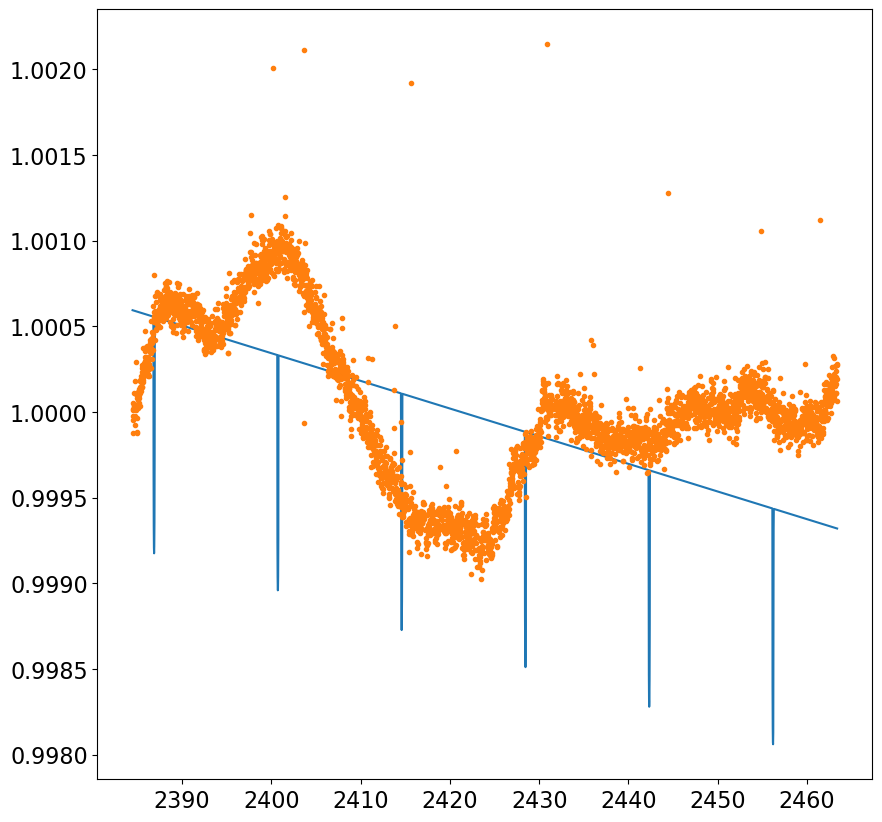

In [28]:
deterministic = light_curve(soln.params,t)
plt.plot(t, deterministic, "-")
plt.plot(t,lcgp_lc-deterministic+1,'.',label='LC+GP')


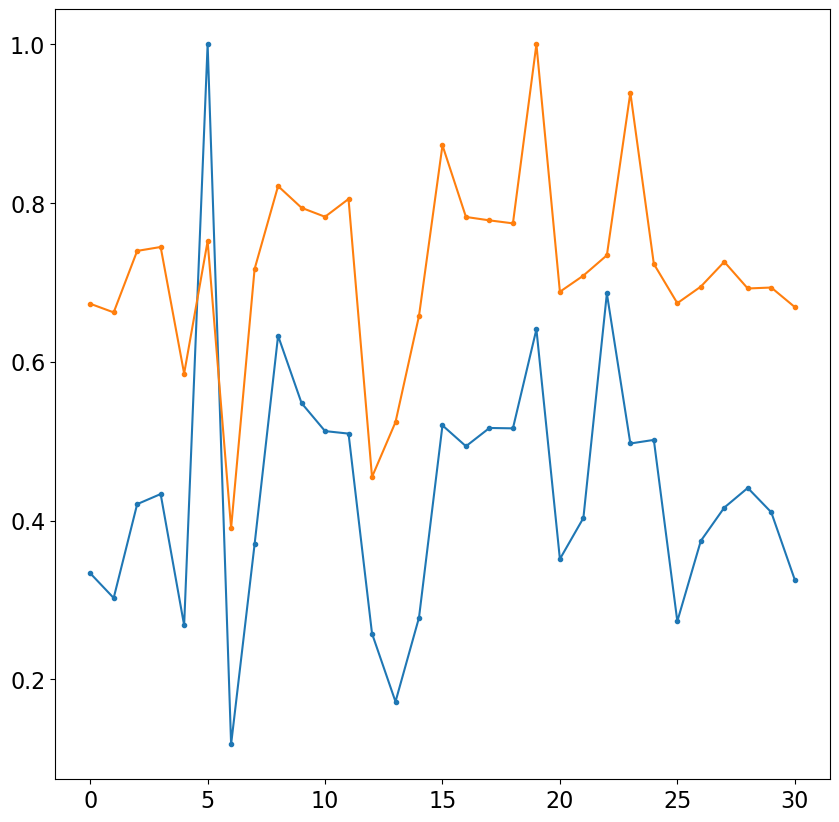

In [29]:
plt.plot(softmax(fullgp_weights),'.-')
plt.plot(softmax(lcgp_weights),'.-')

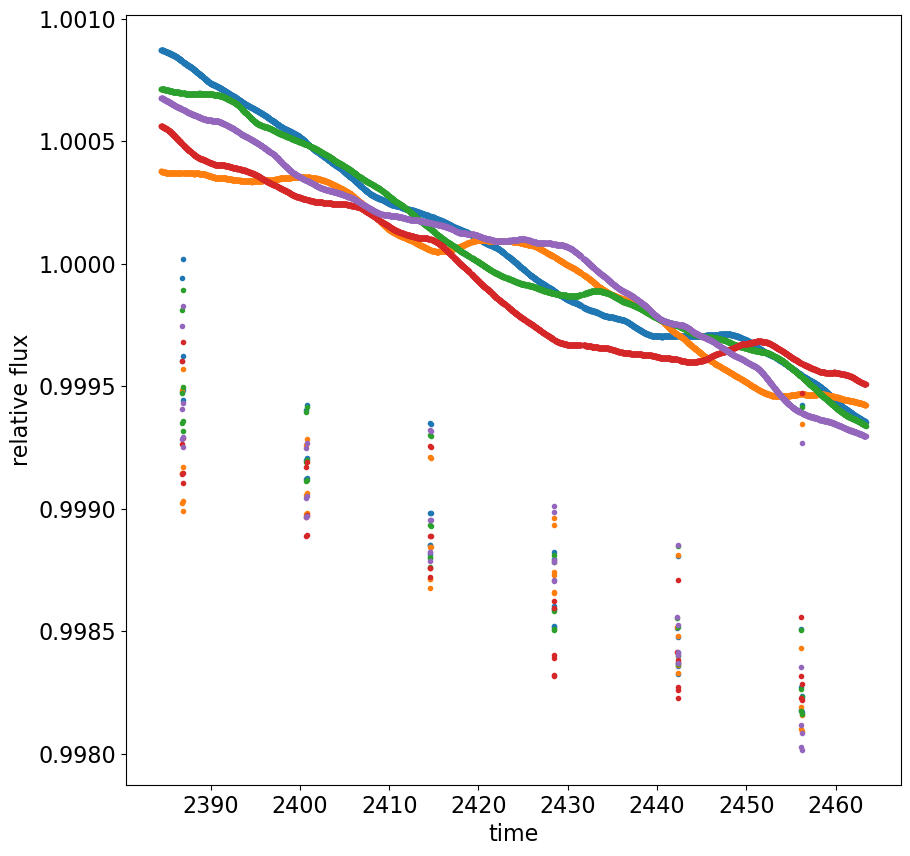

In [30]:

gp = build_gp(soln.params, t, diag=0)

y = gp.sample(jax.random.PRNGKey(4), shape=(5,))
for j in range(5):
    plt.plot(t, y[j,:], ".")
plt.xlabel("time")
plt.ylabel("relative flux");


In [31]:
def make_lc_pix(coefficients,pix):
    intermediate = jnp.dot(pix,coefficients)
    return intermediate / jnp.mean(intermediate)

def model(t, y_err, pix=None, use_gp=True):
    # If we wanted to fit for all the parameters, we could use the following,
    # but we'll keep these fixed for simplicity.
    # log_duration = numpyro.sample("log_duration", dist.Uniform(jnp.log(0.08), jnp.log(0.2)))
    # b = numpyro.sample("b", dist.Uniform(0.0, 1.0))

    log_f0 = numpyro.sample("log_f0", dist.Normal(0.0, 0.01))
    u = numpyro.sample("u", distx.QuadLDParams())
    t0 = numpyro.sample("t0", dist.Normal(0.0, 0.1))
    log_r = numpyro.sample("log_r", dist.Normal(jnp.log(0.1), 2.0))
    numpyro.deterministic("r", jnp.exp(log_r))
    slope = numpyro.sample("slope", dist.Normal(0, 0.01))
    intercept = numpyro.sample("intercept", dist.Normal(1, 0.01))

    params = {
        "log_f0": log_f0,
        "u": u,
        "log_duration": jnp.log(0.12),
        "t0": t0,
        "b": 0.34,
        "log_r": log_r,
        "slope":slope,
        "intercept":intercept
    }
    
    log_coeffs = numpyro.sample("log_coefficients",dist.Uniform(-3*jnp.ones(pix.shape[1]),3*jnp.ones(pix.shape[1])))
    coeffs = numpyro.deterministic("coeffs",10.**log_coeffs)
    
    y = make_lc_pix(coeffs,pix) # generate our own lc

    if use_gp:
        params["log_amp"] = numpyro.sample("log_amp", dist.Normal(0.0, 2.0))
        params["log_ell"] = numpyro.sample("log_ell", dist.Normal(0.0, 2.0))
        gp = build_gp(params, t, diag=y_err**2)
        numpyro.sample("y", gp.numpyro_dist(), obs=y)
        mu = gp.mean_function(t_grid)
        numpyro.deterministic("mu", mu)
        numpyro.deterministic("gp", gp.condition(y, t_grid, include_mean=False).gp.loc)

    else:
        numpyro.sample("y", dist.Normal(light_curve(params, t), y_err), obs=y)
        numpyro.deterministic("mu", light_curve(params, t_grid))


In [32]:

sampler = infer.MCMC(
    infer.NUTS(
        model,
        dense_mass=True,
        target_accept_prob=0.9,
        init_strategy=infer.init_to_value(values=param_guess),
    ),
    num_warmup=500,
    num_samples=1000,
    num_chains=2,
    progress_bar=True,
)
%time sampler.run(jax.random.PRNGKey(11), t, y_err, pix=pixel_series, use_gp=True)


Running chain 1: 100%|██████████████████████| 1500/1500 [47:45<00:00,  1.91s/it]


CPU times: user 1h 7min 45s, sys: 2min 21s, total: 1h 10min 7s
Wall time: 47min 50s


In [33]:
inf_data = az.from_numpyro(sampler)
az.summary(inf_data, var_names=["t0", "r"])

,mean,sd,hdi_3%,hdi_97%,mcse_mean,mcse_sd,ess_bulk,ess_tail,r_hat
t0,2386.532,0.518,2385.431,2386.877,0.342,0.281,3.0,11.0,1.99
r,0.028,0.003,0.025,0.033,0.002,0.002,2.0,11.0,2.77


In [38]:
sampler.get_samples()['coefficients'].shape

(2000, 31)

<ErrorbarContainer object of 3 artists>

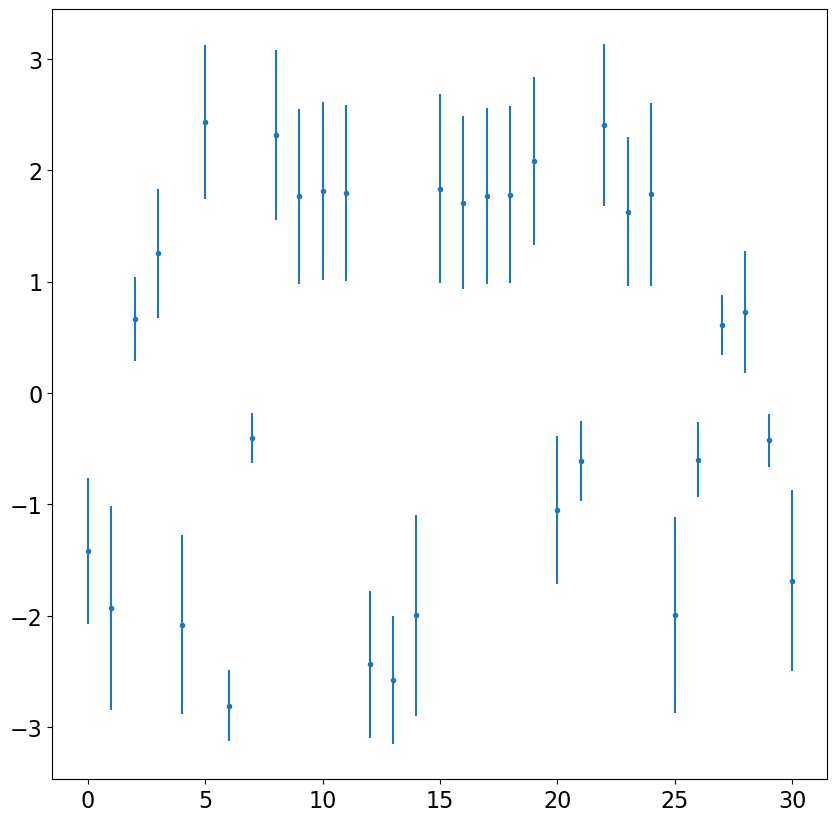

In [44]:
coeffs_posterior = sampler.get_samples()['coefficients']
mean_coeffs = jnp.mean(coeffs_posterior,axis=0)
std_coeffs = jnp.std(coeffs_posterior,axis=0)

plt.errorbar(np.arange(len(mean_coeffs)),mean_coeffs,yerr=std_coeffs,linestyle='None',fmt='.')

In [50]:
import corner

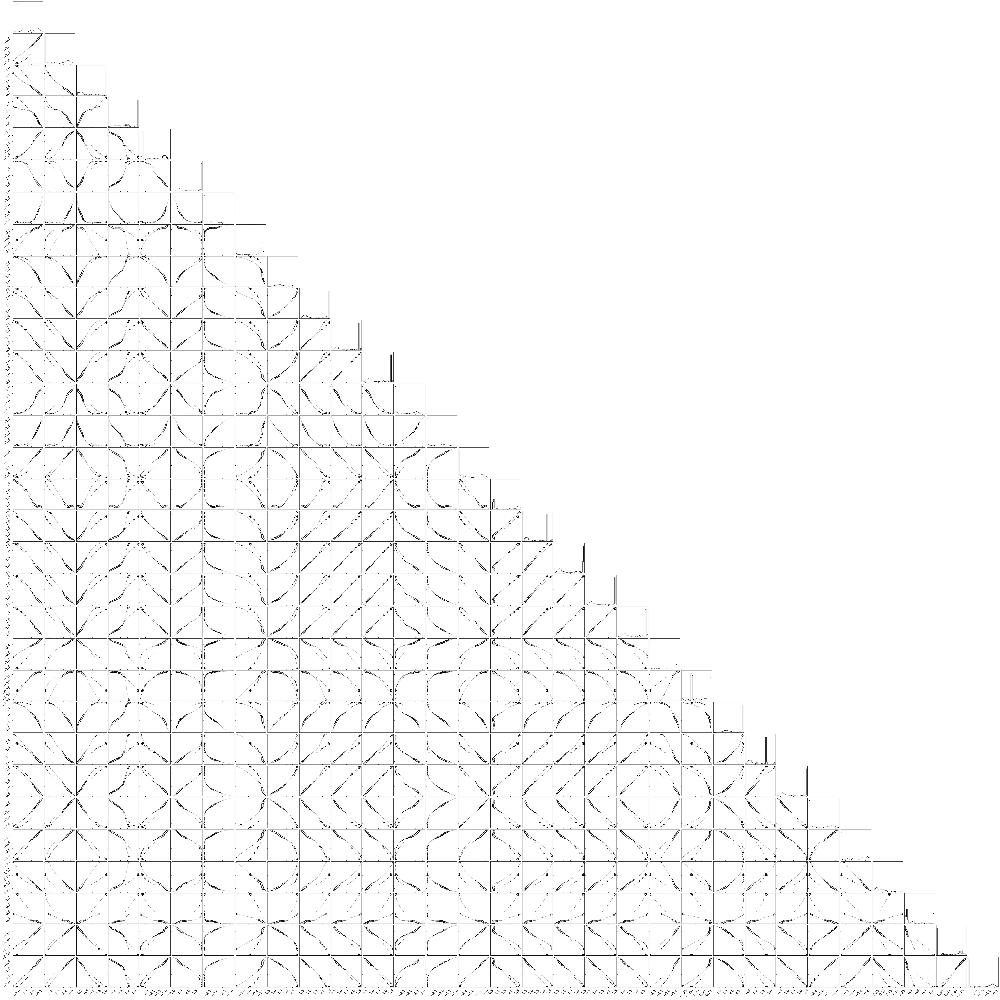

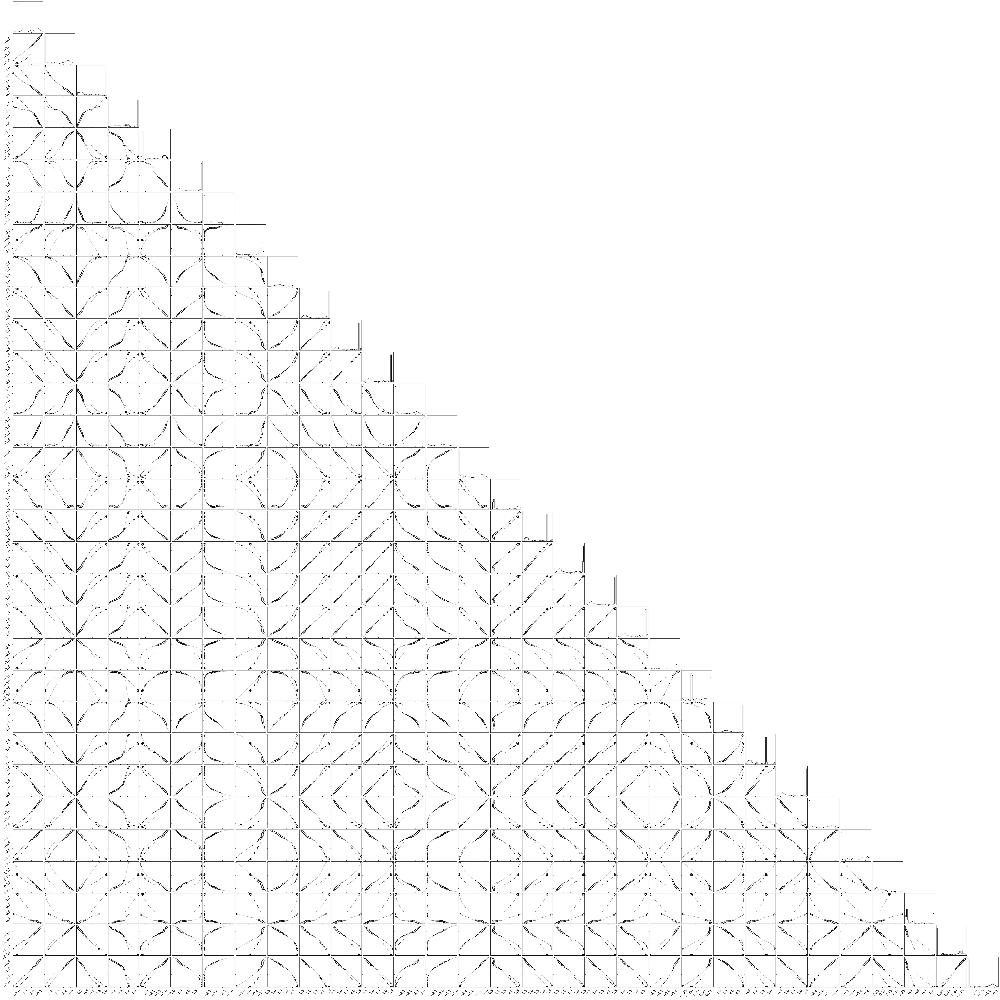

In [60]:
corner.corner(np.array(coeffs_posterior),bins=30)

Text(0, 0.5, 'relative flux')

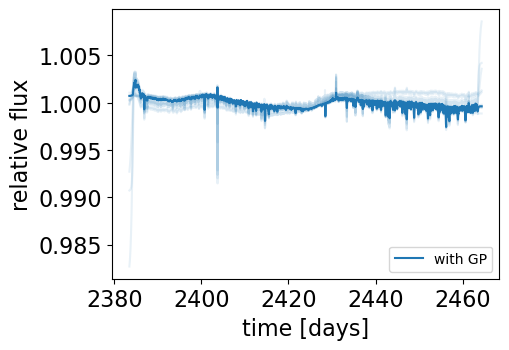

In [49]:
samples = sampler.get_samples()
pred_gp = samples["gp"] + samples["mu"]
pred = samples["mu"]

# samples_wn = sampler_wn.get_samples()
# pred_wn = samples_wn["mu"]

inds = jax.random.randint(jax.random.PRNGKey(0), (12,), 0, len(pred_gp))

plt.figure(figsize=(5, 3.5))

plt.plot(t_grid, pred_gp[inds].T, "C0", alpha=0.1)
plt.plot(t_grid, jnp.median(pred_gp, axis=0), "C0", label="with GP")
# plt.xlim(-0.22, 0.22)
plt.legend(fontsize=10, loc="lower right")
plt.xlabel("time [days]")
plt.ylabel("relative flux")
# plt.savefig(figures / "transit.pdf", bbox_inches="tight")

In [ ]:
dist.Uniform(-3*jnp.ones(pix.shape[1]),3*jnp.ones(pix.shape[1]))